# A Numba Mandelbrot Example

This is an example that demonstrates accelerating a Mandelbrot fractal computation using "CUDA Python" with Numba.

Let's start with a basic Python Mandelbrot set. We use a numpy array for the image and display it using pylab imshow.

import numpy as np
from pylab import imshow, show
from timeit import default_timer as timer
from numba import autojit
from numba import cuda
from numba import *

The `mandel` function performs the Mandelbrot set calculation for a given (x,y) position on the imaginary plane. It returns the number of iterations before the computation "escapes".

def mandel(x, y, max_iters):
  """
    Given the real and imaginary parts of a complex number,
    determine if it is a candidate for membership in the Mandelbrot
    set given a fixed number of iterations.
  """
  c = complex(x, y)
  z = 0.0j
  for i in range(max_iters):
    z = z*z + c
    if (z.real*z.real + z.imag*z.imag) >= 4:
      return i

  return max_iters

`create_fractal` iterates over all the pixels in the image, computing the complex coordinates from the pixel coordinates, and calls the `mandel` function at each pixel. The return value of `mandel` is used to color the pixel.

def create_fractal(min_x, max_x, min_y, max_y, image, iters):
  height = image.shape[0]
  width = image.shape[1]

  pixel_size_x = (max_x - min_x) / width
  pixel_size_y = (max_y - min_y) / height
    
  for x in range(width):
    real = min_x + x * pixel_size_x
    for y in range(height):
      imag = min_y + y * pixel_size_y
      color = mandel(real, imag, iters)
      image[y, x] = color

Next we create a 1536x1024 pixel image as a numpy array of bytes. We then call `create_fractal` with appropriate coordinates to fit the whole mandelbrot set.

image = np.zeros((1024, 1536), dtype = np.uint8)
start = timer()
create_fractal(-2.0, 1.0, -1.0, 1.0, image, 20) 
dt = timer() - start

print ("Mandelbrot created in %f s" % dt)
imshow(image)
show()

You can play with the coordinates to zoom in on different regions in the fractal.

create_fractal(-2.0, -1.7, -0.1, 0.1, image, 20) 
imshow(image)
show()

## Faster Execution with Numba

[Numba](https://github.com/numba/numba) is a Numpy-aware dynamic Python compiler based on the popular LLVM compiler infrastructure. 

Numba is an Open Source NumPy-aware optimizing compiler for Python sponsored by Anaconda. It uses the LLVM compiler infrastructure to compile Python syntax to machine code. It is aware of NumPy arrays as typed memory regions and so can speed-up code using NumPy arrays, such as our Mandelbrot functions.

The simplest way to use Numba is to decorate the functions you want to compile with @autojit. Numba will compile them for the CPU (if it can resolve the types used).

from numba import autojit

@autojit
def mandel(x, y, max_iters):
  """
    Given the real and imaginary parts of a complex number,
    determine if it is a candidate for membership in the Mandelbrot
    set given a fixed number of iterations.
  """
  c = complex(x, y)
  z = 0.0j
  for i in range(max_iters):
    z = z*z + c
    if (z.real*z.real + z.imag*z.imag) >= 4:
      return i

  return max_iters

@autojit
def create_fractal(min_x, max_x, min_y, max_y, image, iters):
  height = image.shape[0]
  width = image.shape[1]

  pixel_size_x = (max_x - min_x) / width
  pixel_size_y = (max_y - min_y) / height
    
  for x in range(width):
    real = min_x + x * pixel_size_x
    for y in range(height):
      imag = min_y + y * pixel_size_y
      color = mandel(real, imag, iters)
      image[y, x] = color

Let's run the `@autojit` code and see if it is faster.

image = np.zeros((1024, 1536), dtype = np.uint8)
start = timer()
create_fractal(-2.0, 1.0, -1.0, 1.0, image, 20) 
dt = timer() - start

print ("Mandelbrot created in %f s" % dt)
imshow(image)
show()

On a server with a Xeon (Haswell) CPU, the time to compute the 1536x1024 mandelbrot set dropped from 4.94s down to 46.6ms. That's a speedup of 106x! The reason this is so much faster is that Numba uses Numpy type information to convert the dynamic Python code into statically compiled machine code, which is many times faster to execute than dynamically typed, interpreted Python code. 

## Even Bigger Speedups with CUDA Python

In addition to various types of automatic vectorization and generalized Numpy Ufuncs, Numba also enables developers to access the CUDA parallel programming model using Python syntax. With CUDA Python, you use parallelism explicitly, just as in other CUDA languages such as CUDA C++ and CUDA Fortran. 

Let's write a CUDA version of our Python Mandelbrot set. We need to import `cuda` from the `numba` module. Then, we need to create a version of the mandel function compiled for the GPU. We can do this without any code duplication by calling `cuda.jit` on the function, specifying `device=True` to indicate that this is a function that will run on the GPU *device*.

from numba import cuda
from numba import *

mandel_gpu = cuda.jit(device=True)(mandel)

In CUDA, a *kernel* is a function that runs in parallel using many threads on the device. We can write a kernel version of our mandelbrot function by simply assuming that it will be run by a *grid* of threads. NumbaPro provides the familiar CUDA `threadIdx`, `blockIdx`, `blockDim` and `gridDim` intrinsics, as well as a `grid()` convenience function which evaluates to `blockDim * blockIdx + threadIdx`.

Our example juse needs a minor modification to compute a grid-size stride for the x and y ranges, since we will have many threads running in parallel. We just add these three lines:

    startX, startY = cuda.grid(2)
    gridX = cuda.gridDim.x * cuda.blockDim.x;
    gridY = cuda.gridDim.y * cuda.blockDim.y;

And we modify the range in the `x` loop to use `range(startX, width, gridX)` (and likewise for the `y` loop).

We decorate the function with @cuda.jit. Numba will infer the type signature from the invocation of the function.

@cuda.jit
def mandel_kernel(min_x, max_x, min_y, max_y, image, iters):
  height = image.shape[0]
  width = image.shape[1]

  pixel_size_x = (max_x - min_x) / width
  pixel_size_y = (max_y - min_y) / height

  startX, startY = cuda.grid(2)
  gridX = cuda.gridDim.x * cuda.blockDim.x;
  gridY = cuda.gridDim.y * cuda.blockDim.y;

  for x in range(startX, width, gridX):
    real = min_x + x * pixel_size_x
    for y in range(startY, height, gridY):
      imag = min_y + y * pixel_size_y 
      image[y, x] = mandel_gpu(real, imag, iters)

#### Device Memory

CUDA kernels must operate on data allocated on the device. NumbaPro provides the cuda.to_device() function to copy a Numpy array to the GPU. 

    d_image = cuda.to_device(image)

The return value (`d_image`) is of type DeviceNDArray, which is a subclass of numpy.ndarray, and provides the `to_host()` function to copy the array back from GPU to CPU memory

    d_image.to_host()

#### Launching Kernels

To launch a kernel on the GPU, we must configure it, specifying the size of the grid in blocks, and the size of each thread block. For a 2D image calculation like the Mandelbrot set, we use a 2D grid of 2D blocks. We'll use blocks of 32x8 threads, and launch 32x16 of them in a 2D grid so that we have plenty of blocks to occupy all of the multiprocessors on the GPU.

Putting this all together, we launch the kernel like this.

gimage = np.zeros((1024, 1536), dtype = np.uint8)
blockdim = (32, 8)
griddim = (32,16)

start = timer()
d_image = cuda.to_device(gimage)
mandel_kernel[griddim, blockdim](-2.0, 1.0, -1.0, 1.0, d_image, 20) 
d_image.to_host()
dt = timer() - start

print ("Mandelbrot created on GPU in %f s" % dt)

imshow(gimage)
show()

You may need to run this last code block twice to see the best performance, because of the JIT and kernel loading overhead the first time you run it. The second time you run it, you may notice that the image was generated almost instantly. On the NVIDIA Tesla P100 GPU installed in my server, it ran in 2.9 milliseconds, which is an additional 16x speedup over the `@autojit` (compiled CPU) code, or a total of nearly 1700x faster than interpreted Python code.

Productivity *and* Performance!

Numba is free and open source software.

@vectorize(['float32(float32, float32)'], target='cuda')
def VectorAdd(a, b):
    return a + b

def main():
    N = 32 * 10**6
    A = np.ones(N, dtype=np.float32)
    B = np.ones(N, dtype=np.float32)
    print(A[:5])
    print(A[-5:])
    start = timer()
    
    C = VectorAdd(A, B)
    finish = timer() - start
    
    print(C[:5])
    print(C[-5:])
    print(f'Time: {finish}')

main()

def cell_value(x, y, iterations):
    c = complex(x, y)
    z = 0.0j
    for i in range(iterations):
        z = z * z + c
        if z.real * z.real + z.imag * z.imag > 4:
            return my_map(i, 0, iterations, 16, 23)
    return iterations

def mandle_generator(img):
    min_x, max_x, min_y, max_y = -2.0, 1.0, -1.0, 1.0
    iterations = 20
    height, width = img.shape[0], img.shape[1]
    
    for x in range(height):
        a_x = my_map(x, 0, height, min_x, max_x)
        for y in range(width):
            a_y =  my_map(y, 0, width, min_y, max_y)
            v = cell_value(a_x, a_y, iterations)
            v = my_map(v, 0, iterations, 0, 255)
            img[x,y] = np.array([v, v, v])


img = np.zeros((100, 100, 3), dtype = np.uint8)

def my_map(value, min_x, max_x, min_y, max_y):
    range_x = max_x - min_x
    range_y = max_y - min_y
    value -= min_x
    return min_y + (value * range_y) / range_x

start = timer()
mandle_generator(img) 
dt = timer() - start

print ("Mandelbrot created in %f s" % dt)
imshow(img, animated=True)
show()



img[x - 1: x + 2, y] + img[x, y - 1: y + 2]

In [1]:
def colors_img_gen(green=0):
    width = height = 256
    img = np.zeros((width, height, 3), dtype = np.uint8)
    for x in range(width):
        img[:, x] = np.full((256, 3), np.array([x, green, 255-x]), dtype= np.uint8)
    return img

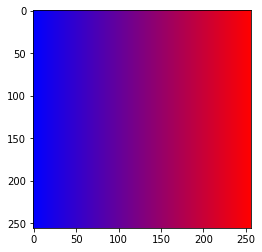

In [13]:
img = colors_img_gen()
imshow(img, animated=True)
show()

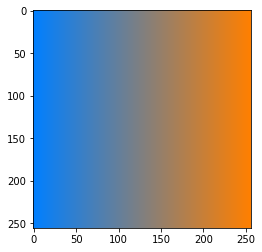

In [14]:
img = colors_img_gen(255/2)
imshow(img, animated=True)
show()

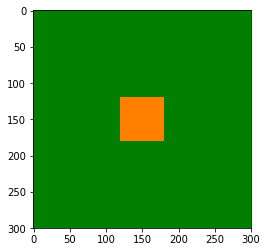

In [25]:
width, height = 300, 300
ratio = 5
green = 255/2
size = (width/(ratio * 2), height/ (ratio * 2))
img = np.zeros((height, width, 3), dtype = np.uint8)
img[:,:] = np.array([0, green, 0])
center_indxs = int(height/2 - size[0]), int(height/2 + size[0]), int(width/2 - size[1]), int(width/2 + size[1]) 
img[center_indxs[0]: center_indxs[1], center_indxs[2]: center_indxs[3]] = np.array([255, 255/2, 0])
imshow(img, animated=True)
show()

In [50]:
def laplacian_cell(img, Lu, x, y):
    Lu[x, y] = np.sum(img[x - 1: x + 2, y] + img[x, y - 1: y + 2]) - 6 * img[x][y]

In [51]:
def one_iter(img):
    Lu = np.zeros((img.shape[0] - 1, img.shape[1] - 1, 3))
    print()
    frame = img[1:-1, 1:-1]
    for x in range(0, height - 1):
        for y in range(0, width - 1):
            laplacian_cell(frame, Lu, x, y)
    frame = frame + 1 * Lu

In [52]:
one_iter(img)

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [2

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [255 127   0]]
[[  0 254   0]
 [  0 254   0]
 [255 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[  0 127   0]
 [255 127   0]
 [255 127   0]]
[[255 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [25

 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [2

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [2

 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [2

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [25

 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [2

 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [2

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [2

[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [  0 127   0]]
[[254 254   0]
 [254 254   0]
 [255 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[255 127   0]
 [  0 127   0]
 [  0 127   0]]
[[255 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [2

[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [25

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [255 127   0]]
[[  0 254   0]
 [  0 254   0]
 [255 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[  0 127   0]
 [255 127   0]
 [255 127   0]]
[[255 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [2

 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [2

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [2

 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [254 254   0]
 [254 254   0]]
[[255 127   0]
 [255 127   0]
 [255 127   0]] [[255 127   0]
 [255 127   0]
 [255 127   0]]
[[254 254   0]
 [2

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [ 

 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [ 

[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  

 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [ 

[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  0 127   0]] [[  0 127   0]
 [  0 127   0]
 [  0 127   0]]
[[  0 254   0]
 [  0 254   0]
 [  0 254   0]]
[[  0 127   0]
 [  0 127   0]
 [  

ValueError: operands could not be broadcast together with shapes (298,298,3) (299,299,3) 

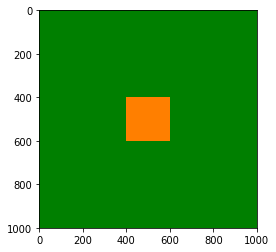

In [53]:
imshow(img, animated=True)
show()

In [54]:
a[1:3] = a[1:3] + b[1:3]

NameError: name 'b' is not defined

In [18]:
from scipy.ndimage.filters import laplace

In [22]:
a = np.array([[1, 2, 3, 4, 5 , 6], [8, 9, 10, 11, 12, 13], [14, 15, 16, 17, 18, 19], [20, 21, 22, 23, 24, 25]])


In [23]:
a

array([[ 1,  2,  3,  4,  5,  6],
       [ 8,  9, 10, 11, 12, 13],
       [14, 15, 16, 17, 18, 19],
       [20, 21, 22, 23, 24, 25]])

In [29]:
x = a[2-1: 2+2, 2]; x

array([10, 16, 22])

In [30]:
y = a[2, 2-1: 2+2]; y

array([15, 16, 17])

In [34]:
x + y

array([25, 32, 39])

In [33]:
np.sum(x + y)

96

In [21]:
laplace(a[1: -1, 1: -1])

array([[ 7,  6,  6,  5],
       [-5, -6, -6, -7]])